## Practical Lab 6 - Logistic Regression

In [50]:
from sklearn.datasets import load_iris
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import itertools

import plotly.graph_objects as go

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score



Loading the data using sklearn with two target variable : virginica and non-virginica

In [36]:

iris = load_iris()
X, y = iris.data, iris.target

y_binary = np.where(y == 2, 1, 0)

print(np.unique(y_binary))


[0 1]


Table showing the descriptive statistics for virginica and non-virginica

In [37]:
data = pd.DataFrame(data=np.c_[X, y_binary], columns=iris.feature_names + ['Class'])

virginica_data = data[data['Class'] == 1]
non_virginica_data = data[data['Class'] == 0]

virginica_stats = virginica_data.describe()

non_virginica_stats = non_virginica_data.describe()

statistics_table = pd.concat([virginica_stats, non_virginica_stats], axis=1, keys=['Virginica', 'Non-Virginica'])

print(statistics_table)

              Virginica                                                       
      sepal length (cm) sepal width (cm) petal length (cm) petal width (cm)   
count          50.00000        50.000000         50.000000         50.00000  \
mean            6.58800         2.974000          5.552000          2.02600   
std             0.63588         0.322497          0.551895          0.27465   
min             4.90000         2.200000          4.500000          1.40000   
25%             6.22500         2.800000          5.100000          1.80000   
50%             6.50000         3.000000          5.550000          2.00000   
75%             6.90000         3.175000          5.875000          2.30000   
max             7.90000         3.800000          6.900000          2.50000   

                Non-Virginica                                      
      Class sepal length (cm) sepal width (cm) petal length (cm)   
count  50.0        100.000000       100.000000        100.000000  \
mean 

A Histogram per feature, for each of the two classes(virginica and non-virginica)

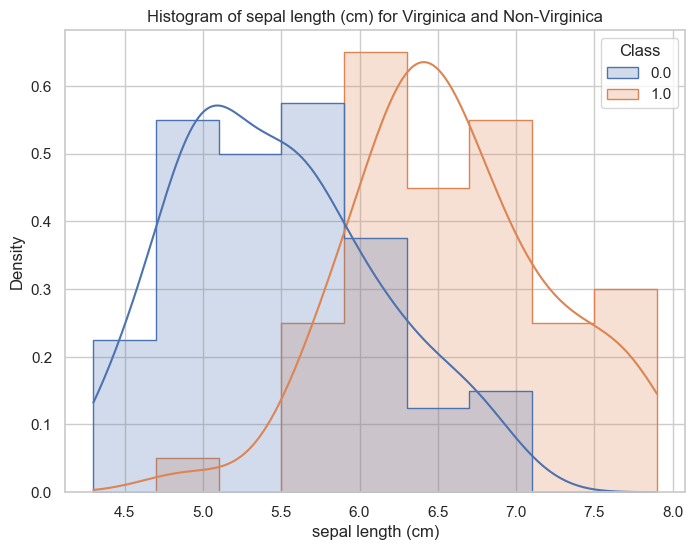

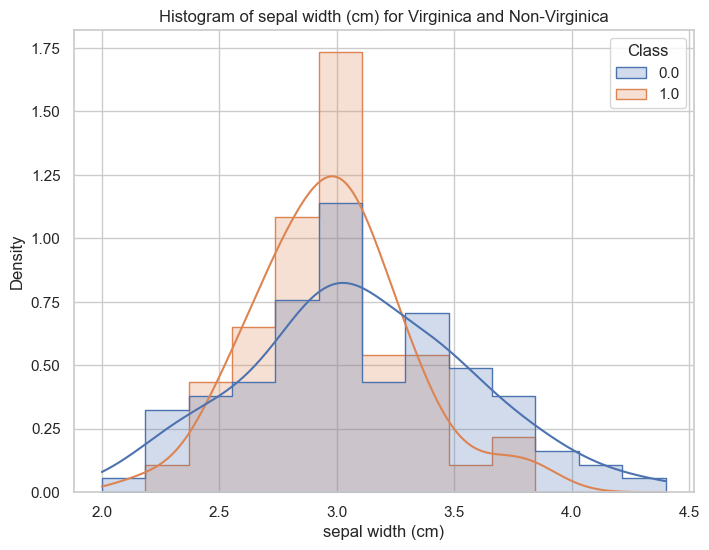

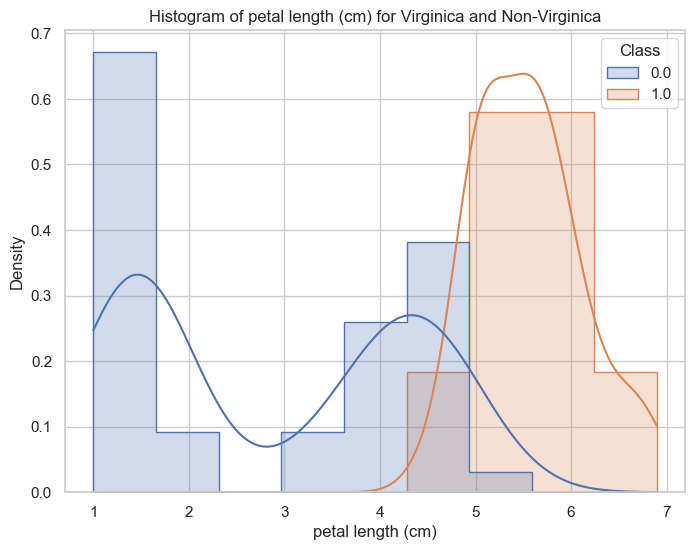

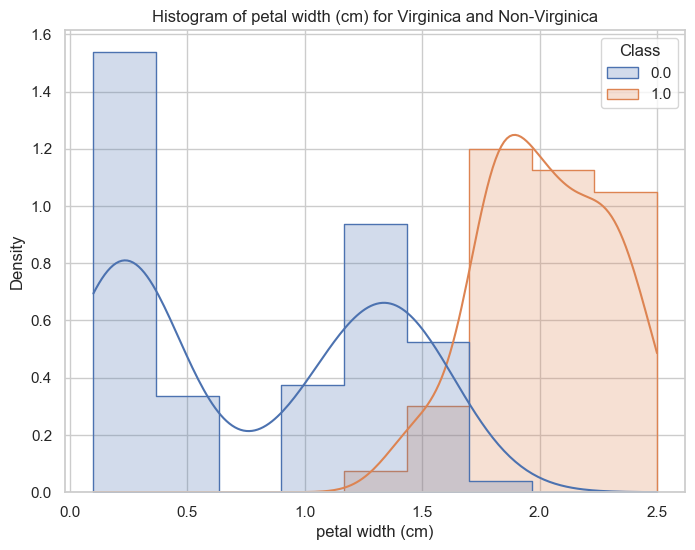

In [39]:

data = pd.DataFrame(data=np.c_[X, y_binary], columns=iris.feature_names + ['Class'])

sns.set_theme(style="whitegrid")

for feature in iris.feature_names:
    plt.figure(figsize=(8, 6))
    sns.histplot(data, x=feature, hue='Class', element="step", stat="density", common_norm=False, kde=True)
    plt.title(f'Histogram of {feature} for Virginica and Non-Virginica')
    plt.show()

The Correlation matrix of the dataset

In [6]:
data = pd.DataFrame(data=X, columns=iris.feature_names)

correlation_matrix = data.corr()

print("Correlation Matrix between the four features:")
print(correlation_matrix)

Correlation Matrix between the four features:
                   sepal length (cm)  sepal width (cm)  petal length (cm)   
sepal length (cm)           1.000000         -0.117570           0.871754  \
sepal width (cm)           -0.117570          1.000000          -0.428440   
petal length (cm)           0.871754         -0.428440           1.000000   
petal width (cm)            0.817941         -0.366126           0.962865   

                   petal width (cm)  
sepal length (cm)          0.817941  
sepal width (cm)          -0.366126  
petal length (cm)          0.962865  
petal width (cm)           1.000000  


Spliting the data into train set (120 records), a validation set (15 records)  and a test set (15 records)

In [40]:

X_train_temp, X_temp, y_train_temp, y_temp = train_test_split(X, y_binary, test_size=0.2, random_state=42)

X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.25, random_state=42)

print(f"Train set size: {len(X_train_temp)} records")
print(f"Validation set size: {len(X_val)} records")
print(f"Test set size: {len(X_test)} records")

Train set size: 120 records
Validation set size: 22 records
Test set size: 8 records


Running four logistic regression models with 1,2,3 and 4 features

In [43]:

def train_logistic_regression(X_train, X_val, y_train, y_val, num_features):
    X_train_subset = X_train[:, :num_features]
    X_val_subset = X_val[:, :num_features]

    model = LogisticRegression(random_state=42)
    model.fit(X_train_subset, y_train)

    y_pred = model.predict(X_val_subset)

    accuracy = accuracy_score(y_val, y_pred)
    return model, accuracy


num_features_list = [1, 2, 3, 4]

for num_features in num_features_list:
    model, accuracy = train_logistic_regression(X_train_temp, X_val, y_train_temp, y_val, num_features)
    print(f"Model with {num_features} feature(s) - Validation Accuracy: {accuracy:.4f}")



Model with 1 feature(s) - Validation Accuracy: 0.9091
Model with 2 feature(s) - Validation Accuracy: 0.9091
Model with 3 feature(s) - Validation Accuracy: 1.0000
Model with 4 feature(s) - Validation Accuracy: 1.0000


Evaluating the models using the predict and predict_proba methods 

In [44]:

def create_evaluation_table(model, X_val, y_val, num_features):

    X_val_subset = X_val[:, :num_features]

    y_pred = model.predict(X_val_subset)
    y_proba = model.predict_proba(X_val_subset)[:, 1]

    evaluation_table = pd.DataFrame({
        'Instance Number': range(1, len(y_val) + 1),
        'Probability of Predicting Virginica': y_proba,
        'Actual Prediction': y_pred,
        'Ground Truth': y_val
    })

    return evaluation_table

for num_features in num_features_list:
    model, accuracy = train_logistic_regression(X_train_temp, X_val, y_train_temp, y_val, num_features)
    print(f"Model with {num_features} feature(s) - Validation Accuracy: {accuracy:.4f}")

    evaluation_table = create_evaluation_table(model, X_val, y_val, num_features)

    print(f"\nEvaluation Table for Model with {num_features} feature(s):")
    print(evaluation_table)
    print("\n")


Model with 1 feature(s) - Validation Accuracy: 0.9091

Evaluation Table for Model with 1 feature(s):
    Instance Number  Probability of Predicting Virginica  Actual Prediction   
0                 1                             0.157514                  0  \
1                 2                             0.382264                  0   
2                 3                             0.714312                  1   
3                 4                             0.578831                  1   
4                 5                             0.132812                  0   
5                 6                             0.053468                  0   
6                 7                             0.044226                  0   
7                 8                             0.064510                  0   
8                 9                             0.217912                  0   
9                10                             0.937717                  1   
10               11           

In [49]:

def calculate_metrics(y_val, y_pred, y_proba):
    accuracy = accuracy_score(y_val, y_pred)
    precision = precision_score(y_val, y_pred)
    recall = recall_score(y_val, y_pred)
    f1 = f1_score(y_val, y_pred)
    roc_auc = roc_auc_score(y_val, y_proba)

    return accuracy, precision, recall, f1, roc_auc

for num_features in num_features_list:
    model, accuracy = train_logistic_regression(X_train_temp, X_val, y_train_temp, y_val, num_features)
    print(f"Model with {num_features} feature(s) - Validation Accuracy: {accuracy:.4f}")

    evaluation_table = create_evaluation_table(model, X_val, y_val, num_features)

    accuracy, precision, recall, f1, roc_auc = calculate_metrics(
        evaluation_table['Ground Truth'],
        evaluation_table['Actual Prediction'],
        evaluation_table['Probability of Predicting Virginica']
    )

    print(f"\nMetrics for Model with {num_features} feature(s):")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")
    print(f"AUC-ROC: {roc_auc:.4f}")
    print("\n")


Model with 1 feature(s) - Validation Accuracy: 0.9091

Metrics for Model with 1 feature(s):
Accuracy: 0.9091


Model with 2 feature(s) - Validation Accuracy: 0.9091

Metrics for Model with 2 feature(s):
Accuracy: 0.9091


Model with 3 feature(s) - Validation Accuracy: 1.0000

Metrics for Model with 3 feature(s):
Accuracy: 1.0000


Model with 4 feature(s) - Validation Accuracy: 1.0000

Metrics for Model with 4 feature(s):
Accuracy: 1.0000




Plotting the decision boundary for three models (with 1, 2 and 3 features; 3 plots)

In [59]:

def plot_decision_boundary(model, X, y, num_features):
    trace = None  
    layout = None  
    decision_boundary = None

    if num_features == 1:
        x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
        xx = np.linspace(x_min, x_max, 100).reshape(-1, 1)
        yy = model.predict_proba(xx)[:, 1]

        trace = go.Scatter(x=X[:, 0], y=y, mode='markers', marker=dict(color=y))
        decision_boundary = go.Scatter(x=xx.flatten(), y=yy, mode='lines', name='Decision Boundary')
        layout = go.Layout(title=f'Decision Boundary - Model with {num_features} feature(s)')
        
    elif num_features == 2:
        trace = go.Scatter(x=X[:, 0], y=X[:, 1], mode='markers', marker=dict(color=y))
        x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
        y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
        xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01), np.arange(y_min, y_max, 0.01))
        Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
        Z = Z.reshape(xx.shape)
        decision_boundary = go.Contour(x=np.arange(x_min, x_max, 0.01), y=np.arange(y_min, y_max, 0.01), z=Z, colorscale='Viridis', opacity=0.5, showscale=False)
        layout = go.Layout(title=f'Decision Boundary - Model with {num_features} features')

    elif num_features == 3:
        trace = go.Scatter3d(x=X[:, 0], y=X[:, 1], z=X[:, 2], mode='markers', marker=dict(color=y))
        x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
        y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
        z_min, z_max = X[:, 2].min() - 1, X[:, 2].max() + 1
        xx, yy, zz = np.meshgrid(np.arange(x_min, x_max, 0.1), np.arange(y_min, y_max, 0.1), np.arange(z_min, z_max, 0.1))
        points = np.c_[xx.ravel(), yy.ravel(), zz.ravel()]
        Z = model.predict(points)
        Z = Z.reshape(xx.shape)
        decision_boundary = go.Surface(x=xx, y=yy, z=Z, opacity=0.2, showscale=False)
        layout = go.Layout(title=f'Decision Boundary - Model with {num_features} features')

    if trace is not None and decision_boundary is not None and layout is not None:
        fig = go.Figure(data=[trace, decision_boundary], layout=layout)
        fig.show()

for num_features in num_features_list:
    model, accuracy = train_logistic_regression(X_train_temp, X_val, y_train_temp, y_val, num_features)
    print(f"Model with {num_features} feature(s) - Validation Accuracy: {accuracy:.4f}")

    plot_decision_boundary(model, X_val, y_val, num_features)




Model with 1 feature(s) - Validation Accuracy: 0.9091


Model with 2 feature(s) - Validation Accuracy: 0.9091


Model with 3 feature(s) - Validation Accuracy: 1.0000


Model with 4 feature(s) - Validation Accuracy: 1.0000


Analysing Failure mode for each model

In [51]:
def analyze_failure_modes(model, X, y, num_features):
    X_subset = X[:, :num_features]

    y_pred = model.predict(X_subset)

    incorrect_indices = np.where(y_pred != y)[0]

    print(f"Failure Modes - Model with {num_features} feature(s):")
    print("Instance\tPredicted\tActual")
    for idx in incorrect_indices:
        print(f"{idx + 1}\t\t{y_pred[idx]}\t\t{y[idx]}")

for num_features in num_features_list:
    model, accuracy = train_logistic_regression(X_train_temp, X_val, y_train_temp, y_val, num_features)
    print(f"\nModel with {num_features} feature(s) - Validation Accuracy: {accuracy:.4f}")

    analyze_failure_modes(model, X_val, y_val, num_features)



Model with 1 feature(s) - Validation Accuracy: 0.9091
Failure Modes - Model with 1 feature(s):
Instance	Predicted	Actual
3		1		0
13		0		1

Model with 2 feature(s) - Validation Accuracy: 0.9091
Failure Modes - Model with 2 feature(s):
Instance	Predicted	Actual
3		1		0
13		0		1

Model with 3 feature(s) - Validation Accuracy: 1.0000
Failure Modes - Model with 3 feature(s):
Instance	Predicted	Actual

Model with 4 feature(s) - Validation Accuracy: 1.0000
Failure Modes - Model with 4 feature(s):
Instance	Predicted	Actual


Recommended model

In [34]:
def train_and_evaluate(X_train, X_val, X_test, y_train, y_val, y_test, num_features):
    model = LogisticRegression(random_state=42)
    model.fit(X_train[:, :num_features], y_train)

    y_val_pred = model.predict(X_val[:, :num_features])

    val_accuracy = accuracy_score(y_val, y_val_pred)

    y_test_pred = model.predict(X_test[:, :num_features])

    test_accuracy = accuracy_score(y_test, y_test_pred)

    return model, val_accuracy, test_accuracy

best_model = None
best_accuracy = 0

for num_features in num_features_list:
    model, val_accuracy, _ = train_and_evaluate(X_train_temp, X_val, X_test, y_train_temp, y_val, y_test, num_features)
    print(f"Model with {num_features} feature(s) - Validation Accuracy: {val_accuracy:.4f}")

    if val_accuracy > best_accuracy:
        best_accuracy = val_accuracy
        best_model = model

_, _, test_accuracy = train_and_evaluate(X_train_temp, X_val, X_test, y_train_temp, y_val, y_test, num_features=len(iris.feature_names))
print(f"\nBest Model - Test Accuracy: {test_accuracy:.4f}")


Model with 1 feature(s) - Validation Accuracy: 0.9091
Model with 2 feature(s) - Validation Accuracy: 0.9091
Model with 3 feature(s) - Validation Accuracy: 1.0000
Model with 4 feature(s) - Validation Accuracy: 1.0000

Best Model - Test Accuracy: 1.0000
